## PATHS

In [ ]:
import os


In [ ]:
CUSTOM_MODEL_NAME = 'fasterrcnn_resnet_v1'
PRETRAINED_MODEL_NAME = 'faster_rcnn_resnet50_v1_640x640_coco17_tpu-8'
PRETRAINED_MODEL_URL = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz'
TF_RECORD_SCRIPT_NAME = 'generate_tfrecord.py'
LABEL_MAP_NAME = 'label_map.pbtxt'

In [ ]:
paths = {
    'WORKSPACE_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace'),
    'SCRIPTS_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow','scripts'),
    'APIMODEL_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow','models'),
    'ANNOTATION_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','annotations'),
    'IMAGE_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','images'),
    'MODEL_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models'),
    'PRETRAINED_MODEL_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME),
    'OUTPUT_PATH': os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'export'),
    'TFJS_PATH':os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfjsexport'),
    'TFLITE_PATH':os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfliteexport'),
    'PROTOC_PATH':os.path.join('/content/drive/MyDrive/capstone/Tensorflow','protoc')
 }

In [ ]:
files = {
    'PIPELINE_CONFIG':os.path.join('/content/drive/MyDrive/capstone/Tensorflow', 'workspace','models', CUSTOM_MODEL_NAME, 'pipeline.config'),
    'TF_RECORD_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], TF_RECORD_SCRIPT_NAME),
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
}

In [ ]:
# for path in paths.values():
#     if not os.path.exists(path):
#         if os.name == 'posix':
#             !mkdir -p {path}
#         if os.name == 'nt':
#             !mkdir {path}

##1. Download TF Models Pretrained Models from Tensorflow Model Zoo and Install TFOD

In [ ]:
if os.name=='nt':
    !pip install wget
    import wget

In [ ]:
if not os.path.exists(os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['APIMODEL_PATH']}

In [ ]:
!pip install tensorflow-object-detection-api

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install tensorflow --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.23.5-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.2
    Uninstalling numpy-1.24.2:
      Successfully uninstalled numpy-1.24.2


In [ ]:
if os.name=='posix':
    !apt-get install protobuf-compiler
    !cd /content/drive/MyDrive/capstone/Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .


if os.name=='nt':
    url="https://github.com/protocolbuffers/protobuf/releases/download/v3.15.6/protoc-3.15.6-win64.zip"
    wget.download(url)
    !move protoc-3.15.6-win64.zip {paths['PROTOC_PATH']}
    !cd {paths['PROTOC_PATH']} && tar -xf protoc-3.15.6-win64.zip
    os.environ['PATH'] += os.pathsep + os.path.abspath(os.path.join(paths['PROTOC_PATH'], 'bin'))
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && copy object_detection\\packages\\tf2\\setup.py setup.py && python setup.py build && python setup.py install
    !cd Tensorflow/models/research/slim && pip install -e .

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.6.1.3-2ubuntu5.2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/MyDrive/capstone/Tensorflow/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 95.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.6/240.6 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
VERIFICATION_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'builders', 'model_builder_tf2_test.py')
# Verify Installation
!python {VERIFICATION_SCRIPT}

2023-02-22 06:46:55.029988: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-22 06:46:55.990919: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-02-22 06:46:55.991034: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-02-22 06:46:55.991053: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF

In [ ]:
!pip uninstall protobuf matplotlib -y
!pip install protobuf matplotlib==3.2

Found existing installation: protobuf 3.19.6
Uninstalling protobuf-3.19.6:
  Successfully uninstalled protobuf-3.19.6
Found existing installation: matplotlib 3.2.0
Uninstalling matplotlib-3.2.0:
  Successfully uninstalled matplotlib-3.2.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached protobuf-4.22.0-cp37-abi3-manylinux2014_x86_64.whl (302 kB)
  Using cached matplotlib-3.2.0-cp38-cp38-manylinux1_x86_64.whl (12.4 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 4.22.0 which is incompatible.
tensorflow-metadata 1.12.0 requires protobuf<4,>=3.13, but you have protobuf 4.22.0 which is incompatible.
tensorboard 2.11.2 requires protobuf<4,>=3.9.2, but you have protobuf 4.22.0 which is incompatible.
apache-beam 2.45.0 requires p

In [ ]:
import object_detection
!pip list

Package                         Version
------------------------------- ----------------------
absl-py                         1.4.0
aeppl                           0.0.33
aesara                          2.7.9
aiohttp                         3.8.4
aiosignal                       1.3.1
alabaster                       0.7.13
albumentations                  1.2.1
altair                          4.2.2
apache-beam                     2.45.0
appdirs                         1.4.4
argon2-cffi                     21.3.0
argon2-cffi-bindings            21.2.0
arviz                           0.12.1
astor                           0.8.1
astropy                         4.3.1
astunparse                      1.6.3
async-timeout                   4.0.2
atari-py                        0.2.9
atomicwrites                    1.4.1
attrs                           22.2.0
audioread                       3.0.0
autograd                        1.5
avro-python3                    1.10.2
Babel                    

In [ ]:
if os.name =='posix':
    !wget {PRETRAINED_MODEL_URL}
    !mv {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}
if os.name == 'nt':
    wget.download(PRETRAINED_MODEL_URL)
    !move {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}

--2023-01-26 13:35:00--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.20.128, 2607:f8b0:400e:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.20.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  45.0MB/s    in 4.8s    

2023-01-26 13:35:05 (42.2 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]

faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/chec

## image with annot

In [ ]:
from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET

tree = ET.parse('/content/Tensorflow/workspace/annotations/95-5-10-1_1032_1.xml')
root = tree.getroot()

sample_annotations = []

for neighbor in root.iter('bndbox'):
    xmin = int(neighbor.find('xmin').text)
    ymin = int(neighbor.find('ymin').text)
    xmax = int(neighbor.find('xmax').text)
    ymax = int(neighbor.find('ymax').text)

#     print(xmin, ymin, xmax, ymax)
    sample_annotations.append([xmin, ymin, xmax, ymax])

print(sample_annotations)

[[227, 205, 353, 369]]


[227, 205, 353, 369]


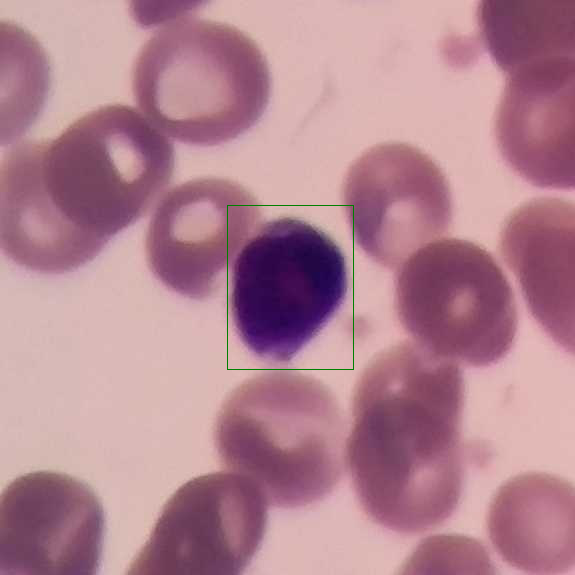

In [ ]:
sample_image =Image.open('/content/Tensorflow/workspace/images/95-5-10-1_1032_1.jpg')
sample_image_annotated = sample_image.copy()

img_bbox = ImageDraw.Draw(sample_image_annotated)

for bbox in sample_annotations:
    print(bbox)
    img_bbox.rectangle(bbox, outline="green")

sample_image_annotated

## splitting (hopefully)

In [ ]:
import os
import shutil
import random

WBC_PATH = "/content/drive/MyDrive/capstone/wbc_bb"
MONO_PATH = "/content/drive/MyDrive/capstone/wbc_bb/mononuclear"
POLY_PATH = "/content/drive/MyDrive/capstone/wbc_bb/polymorphonuclear"
BASO_POLY_PATH = "/content/drive/MyDrive/capstone/wbc_bb/basophil-poly"

In [ ]:
#### old splitting

from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET

def train_test_split(folder, cell_type):
  count = 0
  IMAGE_PATH = "/content/drive/MyDrive/capstone/Tensorflow/workspace/images/train"
  ANNOTATION_PATH = "/content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/train"

  for f in os.listdir(folder):
    if 'xml' in f:

        tree = ET.parse(os.path.join(folder,f))
        root = tree.getroot()

        for neighbor in root.iter('annotation'):
            path = neighbor.find('path').text
            if cell_type in path:
              image = f.replace('xml','jpg')
              shutil.copy(os.path.join(folder,image),IMAGE_PATH)
              shutil.copy(os.path.join(folder,f), IMAGE_PATH)
              count += 1
            # print(count)
            if count == 80:
              # print("----------------------",count,"-----------------")
              # print("path changes")
              IMAGE_PATH = "/content/drive/MyDrive/capstone/Tensorflow/workspace/images/test"





In [ ]:
train_test_split(MONO_PATH,'Lymphocyte')

In [ ]:
train_test_split(MONO_PATH,'Monocyte')

In [ ]:
train_test_split(POLY_PATH,'Eosinophil')

In [ ]:
train_test_split(POLY_PATH,'Neutrophil')

In [ ]:
train_test_split(BASO_POLY_PATH,'Basophil')

In [ ]:
c = 0
for i in os.listdir("/content/drive/MyDrive/capstone/Tensorflow/workspace/images/train"):
  if 'xml' in i:
    c+=1
c

400

## tf records

In [ ]:
labels = [{'name':'mononuclear', 'id':1}, {'name':'polymorphonuclear', 'id':2}]

with open("/content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/label_map", 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

In [ ]:
!git clone https://github.com/nicknochnack/GenerateTFRecord {"/content/drive/MyDrive/capstone/Tensorflow/scripts"}

fatal: destination path '/content/drive/MyDrive/capstone/Tensorflow/scripts' already exists and is not an empty directory.


In [ ]:
TF_RECORD = "/content/drive/MyDrive/capstone/Tensorflow/scripts/generate_tfrecord.py"
IMAGE_TRAIN = "/content/drive/MyDrive/capstone/Tensorflow/workspace/images/train"
IMAGE_TEST = "/content/drive/MyDrive/capstone/Tensorflow/workspace/images/test"
LABEL_MAP = "/content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/label_map.pbtxt"

In [ ]:
!python {TF_RECORD} -x {IMAGE_TRAIN} -l {LABEL_MAP} -o {"/content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/train.record"}
!python {TF_RECORD} -x {IMAGE_TEST} -l {LABEL_MAP} -o {"/content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/test.record"}

Successfully created the TFRecord file: /content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/train.record
Successfully created the TFRecord file: /content/drive/MyDrive/capstone/Tensorflow/workspace/annotations/test.record


## Copy Model Config and copy

In [ ]:
if os.name =='posix':
    !cp {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}
if os.name == 'nt':
    !copy {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}

In [ ]:
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format
config = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
config

{'model': faster_rcnn {
   num_classes: 90
   image_resizer {
     keep_aspect_ratio_resizer {
       min_dimension: 640
       max_dimension: 640
       pad_to_max_dimension: true
     }
   }
   feature_extractor {
     type: "faster_rcnn_resnet50_keras"
     batch_norm_trainable: true
   }
   first_stage_anchor_generator {
     grid_anchor_generator {
       height_stride: 16
       width_stride: 16
       scales: 0.25
       scales: 0.5
       scales: 1.0
       scales: 2.0
       aspect_ratios: 0.5
       aspect_ratios: 1.0
       aspect_ratios: 2.0
     }
   }
   first_stage_box_predictor_conv_hyperparams {
     op: CONV
     regularizer {
       l2_regularizer {
         weight: 0.0
       }
     }
     initializer {
       truncated_normal_initializer {
         stddev: 0.009999999776482582
       }
     }
   }
   first_stage_nms_score_threshold: 0.0
   first_stage_nms_iou_threshold: 0.699999988079071
   first_stage_max_proposals: 300
   first_stage_localization_loss_weight: 2.0

## TRAIN

In [ ]:
TRAINING_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'model_main_tf2.py')
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=5000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])
print(command)

python /content/drive/MyDrive/capstone/Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1 --pipeline_config_path=/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1/pipeline.config --num_train_steps=5000


In [ ]:
!{command}

2023-02-22 13:56:37.920306: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-02-22 13:56:37.920410: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-02-22 13:56:37.920430: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
2023-02-22 13:56:41.174990: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environme

## **EVAL**

In [ ]:
command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={}".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'])
print(command)

python /content/drive/MyDrive/capstone/Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1 --pipeline_config_path=/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1/pipeline.config --checkpoint_dir=/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1


In [ ]:
!{command}

2023-04-19 14:04:16.139761: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-19 14:04:17.117591: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Traceback (most recent call last):
  File "/content/drive/MyDrive/capstone/Tensorflow/models/research/object_detection/model_main_tf2.py", line 31, in <module>
    from object_detection import model_lib_v2
ModuleNotFoundError: No module named 'object_detection'
^C


In [ ]:
%load_ext tensorboard
import datetime, os

In [ ]:
%cd /content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1/eval
%tensorboard --logdir=.

/content/drive/MyDrive/capstone/Tensorflow/workspace/models/fasterrcnn_resnet_v1/eval


<IPython.core.display.Javascript object>

## LOAD IMAGES AND DETECT


In [ ]:
import os
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util
# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
detection_model = model_builder.build(model_config=configs['model'], is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(paths['CHECKPOINT_PATH'], 'ckpt-6')).expect_partial()

@tf.function
def detect_fn(image):
    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)
    return detections

/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
category_index = label_map_util.create_category_index_from_labelmap(files['LABELMAP'])
IMAGE_PATH = "/content/95-8-10-1_39_1.jpg"

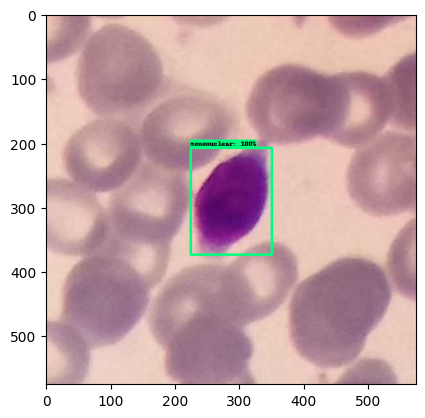

In [ ]:
img = cv2.imread(IMAGE_PATH)
image_np = np.array(img)

input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
detections = detect_fn(input_tensor)

num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=.8,
            agnostic_mode=False)

plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET

tree = ET.parse('/content/95-5-4-1_189_1.xml')
root = tree.getroot()

sample_annotations = []

for neighbor in root.iter('bndbox'):
    xmin = int(neighbor.find('xmin').text)
    ymin = int(neighbor.find('ymin').text)
    xmax = int(neighbor.find('xmax').text)
    ymax = int(neighbor.find('ymax').text)

#     print(xmin, ymin, xmax, ymax)
    sample_annotations.append([xmin, ymin, xmax, ymax])

print(sample_annotations)

[[168, 151, 441, 453]]


[168, 151, 441, 453]


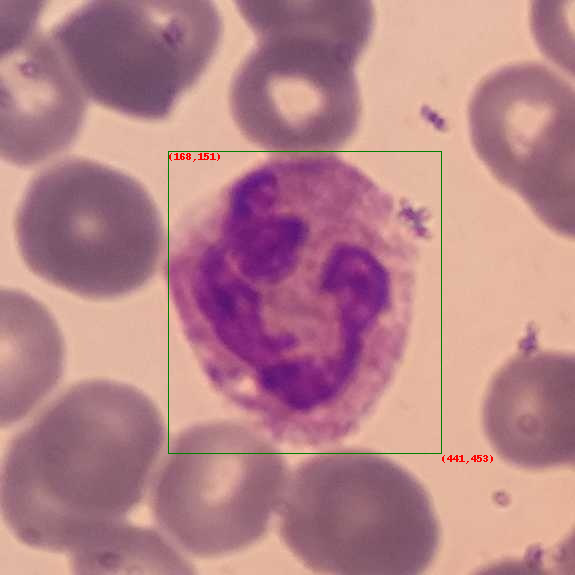

In [ ]:
from PIL import Image, ImageFont, ImageDraw

sample_image =Image.open('/content/95-5-4-1_189_1.jpg')
sample_image_annotated = sample_image.copy()

img_bbox = ImageDraw.Draw(sample_image_annotated)
img_bbox.text((bbox[0], bbox[1]),"({},{})".format(bbox[0],bbox[1]), align ="left", fill='red')
img_bbox.text((bbox[2], bbox[3]),"({},{})".format(bbox[2],bbox[3]), align ="left", fill='red')
for bbox in sample_annotations:
    print(bbox)
    img_bbox.rectangle(bbox, outline="green")

sample_image_annotated